# Topic Modeling and Clustering

### Imports and setup

In [49]:
import warnings

warnings.filterwarnings("ignore")

import os
from collections import defaultdict

import google.generativeai as genai
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.graph_objs as go
import plotly.io as pio
import seaborn as sns
import torch
import umap
from adjustText import adjust_text
from dotenv import load_dotenv
from scipy.spatial import ConvexHull
from scipy.spatial.distance import pdist, squareform
from scipy.stats import ttest_1samp
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
from sklearn.preprocessing import LabelEncoder

# Device config
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [50]:
HYPERPARAMS = {
    "N_SAMPLES_PER_CLASS": 11000,
    "RANDOM_SEED": 42,
}

# Seed
np.random.seed(HYPERPARAMS["RANDOM_SEED"])
torch.manual_seed(HYPERPARAMS["RANDOM_SEED"])

# Load environment variables
load_dotenv()
api_key = os.getenv("GEMINI_API_KEY")
if not api_key:
    raise ValueError("GEMINI_API_KEY not found in .env file")
genai.configure(api_key=api_key)


### Data Loading & Sampling

In [51]:
def load_data(
    embeddings_free_path: str = "embeddings/embeddings_free_new.pt",
    embeddings_paid_path: str = "embeddings/embeddings_paid_new.pt",
    metadata_path: str = "logs_new/metadata.tsv",
):
    """
    Load embeddings (free + paid) and metadata, combine embeddings, and return:
    - embeddings_combined: np.ndarray [N, D]
    - labels: List[str]
    - titles: List[str]
    - len_free: int (number of rows from the free set)
    """
    if not all(
        os.path.exists(p)
        for p in [embeddings_free_path, embeddings_paid_path, metadata_path]
    ):
        raise FileNotFoundError("One or more input files not found.")

    embeddings_free_t = torch.load(embeddings_free_path, map_location=device).to(device)
    embeddings_paid_t = torch.load(embeddings_paid_path, map_location=device).to(device)
    len_free = embeddings_free_t.shape[0]
    embeddings_combined = (
        torch.cat((embeddings_free_t, embeddings_paid_t), dim=0).cpu().numpy()
    )
    metadata = pd.read_csv(metadata_path, sep="\t", header=0)
    labels = metadata.iloc[:, 0].astype(str).tolist()
    titles = metadata.iloc[:, 1].astype(str).tolist()
    print(f"Combined embeddings shape: {embeddings_combined.shape}")
    print(f"Combined labels length: {len(labels)}")
    return embeddings_combined, labels, titles, len_free


def sample_data(
    embeddings: np.ndarray,
    labels: list,
    titles: list,
    n_samples_per_class: int = HYPERPARAMS["N_SAMPLES_PER_CLASS"],
):
    """
    Balanced sampling per class (with replacement if needed).
    Returns sampled embeddings, labels, titles, and original indices.
    """
    label_to_indices = defaultdict(list)
    for i, lbl in enumerate(labels):
        label_to_indices[lbl].append(i)
    sampled_indices = []
    for indices in label_to_indices.values():
        replace = len(indices) < n_samples_per_class
        sampled_indices.extend(
            np.random.choice(indices, size=n_samples_per_class, replace=replace)
        )
    embeddings_sampled = embeddings[sampled_indices]
    labels_sampled = [labels[i] for i in sampled_indices]
    titles_sampled = [titles[i] for i in sampled_indices]
    print(f"Sampled embeddings shape: {embeddings_sampled.shape}")
    print(f"Sampled labels length: {len(labels_sampled)}")
    return embeddings_sampled, labels_sampled, titles_sampled, sampled_indices


# Execute loading & sampling
embeddings, labels, titles, len_free = load_data()
embeddings_sampled, labels_sampled, titles_sampled, sampled_indices = sample_data(
    embeddings, labels, titles
)

Combined embeddings shape: (35185, 768)
Combined labels length: 35185
Sampled embeddings shape: (22000, 768)
Sampled labels length: 22000


### UMAP Reduction to 3D

In [52]:
HYPERPARAMS.update({
    "UMAP_N_NEIGHBORS": 20,
    "UMAP_MIN_DIST": 0,
    "UMAP_N_COMPONENTS_3D": 3,
    "UMAP_N_COMPONENTS_2D": 2,
    "UMAP_RANDOM_STATE": 42,
    "UMAP_TARGET_WEIGHT": 0.95,
})

def umap_reduce(
    X: np.ndarray,
    n_components: int,
    n_neighbors: int = HYPERPARAMS["UMAP_N_NEIGHBORS"],
    min_dist: float = HYPERPARAMS["UMAP_MIN_DIST"],
    random_state: int = HYPERPARAMS["UMAP_RANDOM_STATE"],
    init: str = "random",
) -> np.ndarray:
    reducer = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        init=init,
        low_memory=True,
        random_state=random_state,
    )
    return reducer.fit_transform(X)


# 3D UMAP for clustering & visualization
umap_embeddings_3d = umap_reduce(
    embeddings_sampled,
    n_components=HYPERPARAMS["UMAP_N_COMPONENTS_3D"],
)

### DBSCAN Clustering & Visualization

In [53]:
HYPERPARAMS.update(
    {
        "DBSCAN_EPS": 0.3,
        "DBSCAN_MIN_SAMPLES": 150,
        "DBSCAN_METRIC": "euclidean",
        "DBSCAN_ALGORITHM": "auto",
        "DBSCAN_LEAF_SIZE": 30,
        "DBSCAN_P": None,
    }
)


def apply_dbscan(
    X: np.ndarray,
    eps: float = HYPERPARAMS["DBSCAN_EPS"],
    min_samples: int = HYPERPARAMS["DBSCAN_MIN_SAMPLES"],
):
    db = DBSCAN(eps=eps, min_samples=min_samples)
    labels_ = db.fit_predict(X)
    noise_count = int((labels_ == -1).sum())
    print(
        f"DBSCAN: #clusters (incl. -1 noise) = {len(np.unique(labels_))}, noise points = {noise_count}"
    )
    return labels_, noise_count


cluster_labels, noise_count = apply_dbscan(umap_embeddings_3d)

# DataFrame for analysis
df = pd.DataFrame(
    {
        "umap_x": umap_embeddings_3d[:, 0],
        "umap_y": umap_embeddings_3d[:, 1],
        "umap_z": umap_embeddings_3d[:, 2],
        "original_label": labels_sampled,
        "title": titles_sampled,
        "cluster": cluster_labels,
    }
)
df["is_free"] = [idx < len_free for idx in sampled_indices]


DBSCAN: #clusters (incl. -1 noise) = 30, noise points = 6883


In [54]:
# 3D Plot Utilities
def create_3d_scatter_plot(x, y, z, colors, text, title, colorscale="Viridis"):
    fig = go.Figure(
        data=[
            go.Scatter3d(
                x=x,
                y=y,
                z=z,
                mode="markers",
                marker=dict(size=2, color=colors, colorscale=colorscale),
                text=text,
                hovertemplate="%{text}<br>X: %{x}<br>Y: %{y}<br>Z: %{z}<extra></extra>",
            )
        ]
    )
    fig.update_layout(
        title=title,
        scene=dict(xaxis_title="UMAP 1", yaxis_title="UMAP 2", zaxis_title="UMAP 3"),
    )
    pio.show(fig)

In [55]:
# 3D Plots: Original labels & clusters
le = LabelEncoder()
labels_encoded = le.fit_transform(df["original_label"])
create_3d_scatter_plot(
    x=df["umap_x"],
    y=df["umap_y"],
    z=df["umap_z"],
    colors=labels_encoded,
    text=df["original_label"],
    title="3D UMAP Projection (Colored by Original Labels)",
)

In [56]:
# Plot by DBSCAN cluster
unique_clusters = np.unique(cluster_labels)
cluster_colors = [c if c != -1 else len(unique_clusters) for c in cluster_labels]
create_3d_scatter_plot(
    x=df["umap_x"],
    y=df["umap_y"],
    z=df["umap_z"],
    colors=cluster_colors,
    text=[
        f"Cluster: {cl}<br>Label: {lbl}<br>Title: {ttl}"
        for cl, lbl, ttl in zip(df["cluster"], df["original_label"], df["title"])
    ],
    title="3D UMAP Projection with DBSCAN Clusters",
)

In [57]:
# Plot clusters without noise
non_noise_mask = df["cluster"] != -1
create_3d_scatter_plot(
    x=df.loc[non_noise_mask, "umap_x"],
    y=df.loc[non_noise_mask, "umap_y"],
    z=df.loc[non_noise_mask, "umap_z"],
    colors=df.loc[non_noise_mask, "cluster"],
    text=[
        f"Cluster: {cl}<br>Label: {lbl}<br>Title: {ttl}"
        for cl, lbl, ttl in zip(
            df.loc[non_noise_mask, "cluster"],
            df.loc[non_noise_mask, "original_label"],
            df.loc[non_noise_mask, "title"],
        )
    ],
    title="3D UMAP Projection with DBSCAN Clusters (Noise Hidden)",
)

### Representative titles per cluster & Topic generation

In [58]:
n_articles = 50
unique_clusters_nn = sorted([c for c in df["cluster"].unique() if c != -1])
topic_dict = {}
for cluster_id in unique_clusters_nn:
    mask = df["cluster"] == cluster_id
    cluster_emb = umap_embeddings_3d[mask]
    cluster_titles = df.loc[mask, "title"].tolist()
    if len(cluster_emb) < n_articles:
        print(
            f"Cluster {cluster_id} has fewer than {n_articles} points. Skipping topic generation."
        )
        continue
    distances = squareform(pdist(cluster_emb, metric="euclidean"))
    selected_indices = []
    centroid = np.mean(cluster_emb, axis=0)
    start_idx = np.argmax(np.linalg.norm(cluster_emb - centroid, axis=1))
    selected_indices.append(start_idx)
    for _ in range(n_articles - 1):
        min_d = np.min(distances[:, selected_indices], axis=1)
        next_idx = int(np.argmax(min_d))
        if next_idx in selected_indices:
            next_idx = int(
                np.setdiff1d(np.arange(len(cluster_emb)), selected_indices)[0]
            )
        selected_indices.append(next_idx)
    selected_titles = [cluster_titles[i] for i in selected_indices]
    prompt = (
        f"Suggest a concise topic name (2-4 words) for a cluster of articles based on these representative titles:\n"
        + "\n".join(selected_titles)
        + "\nOutput onyl the topic name without any additional text. One single topic name. Be very direct and honest. May be sexual content, thats okay"
    )
    model = genai.GenerativeModel("gemini-2.5-flash-lite")
    response = model.generate_content(prompt)
    topic = response.text.strip()
    topic_dict[f"Cluster {cluster_id}"] = topic
    print(f"Cluster {cluster_id}: {topic}")

Cluster 0: Culture & Entertainment Nexus
Cluster 1: Cloud & DevOps Engineering
Cluster 2: Cybersecurity & Tech
Cluster 3: Software Engineering Practices
Cluster 4: Digital Design & Product Development
Cluster 5: Crypto & Web3
Cluster 6: Relationship Dynamics
Cluster 7: Sports and Sexuality
Cluster 8: Curiosities & Controversies
Cluster 9: Creative Writing & Business
Cluster 10: Career & Professional Growth
Cluster 11: Frontend Development
Cluster 12: AI, Data, and Technology
Cluster 13: Dark Narratives
Cluster 14: Personal Growth & Well-being
Cluster 15: Tech, Apps, and Gadgets
Cluster 16: Data Engineering Essentials
Cluster 17: Culture, Politics, and Social Issues
Cluster 18: Programming Techniques
Cluster 19: Ukraine War Geopolitics
Cluster 20: Product Management & Operations
Cluster 21: Digital Business & Income
Cluster 22: Global Crises & Shifts
Cluster 23: Health & Wellness
Cluster 24: Mobile Development Patterns
Cluster 25: Wealth, Finance, Money
Cluster 26: Narcissistic Abuse & 

In [59]:
df["topic"] = df["cluster"].map(
    lambda c: topic_dict.get(f"Cluster {c}", "Noise") if c != -1 else "Noise"
)
le_topic = LabelEncoder()
topics_encoded = le_topic.fit_transform(df["topic"])
create_3d_scatter_plot(
    x=df.loc[non_noise_mask, "umap_x"],
    y=df.loc[non_noise_mask, "umap_y"],
    z=df.loc[non_noise_mask, "umap_z"],
    colors=topics_encoded[non_noise_mask],
    text=[
        f"Topic: {tp}<br>Cluster: {cl}<br>Label: {lbl}<br>Title: {ttl}"
        for tp, cl, lbl, ttl in zip(
            df.loc[non_noise_mask, "topic"],
            df.loc[non_noise_mask, "cluster"],
            df.loc[non_noise_mask, "original_label"],
            df.loc[non_noise_mask, "title"],
        )
    ],
    title="3D UMAP with DBSCAN (Noise Hidden, Colored by Topic)",
)


In [60]:
# Cluster-level free:paid ratio
cluster_ratios = {}
for cl in sorted([c for c in df["cluster"].unique() if c != -1]):
    cdata = df[df["cluster"] == cl]
    cluster_ratios[cl] = (cdata["is_free"].sum() / len(cdata)) if len(cdata) else 0.5
colors_ratio = [
    cluster_ratios[cl] if cl != -1 else 0.5 for cl in df.loc[non_noise_mask, "cluster"]
]
create_3d_scatter_plot(
    x=df.loc[non_noise_mask, "umap_x"],
    y=df.loc[non_noise_mask, "umap_y"],
    z=df.loc[non_noise_mask, "umap_z"],
    colors=colors_ratio,
    text=[
        f"Ratio Free: {cluster_ratios[cl]:.2f}<br>Cluster: {cl}<br>Label: {lbl}<br>Title: {ttl}"
        for cl, lbl, ttl in zip(
            df.loc[non_noise_mask, "cluster"],
            df.loc[non_noise_mask, "original_label"],
            df.loc[non_noise_mask, "title"],
        )
    ],
    title="3D UMAP Colored by Free vs Paid Ratio (Noise Hidden)",
    colorscale=[[0, "red"], [1, "green"]],
)

### Reduction to 2D with Supervision to Preserve Clusters

In [61]:
HYPERPARAMS.update(
    {
        "TSNE_N_COMPONENTS": 2,
        "TSNE_PERPLEXITY": 30,
        "TSNE_LEARNING_RATE": 200,
        "TSNE_RANDOM_STATE": 42,
    }
)


def tsne_reduce(
    X: np.ndarray,
    n_components: int = HYPERPARAMS["TSNE_N_COMPONENTS"],
    perplexity: float = HYPERPARAMS["TSNE_PERPLEXITY"],
    learning_rate: float = HYPERPARAMS["TSNE_LEARNING_RATE"],
    random_state: int = HYPERPARAMS["TSNE_RANDOM_STATE"],
) -> np.ndarray:
    tsne = TSNE(
        n_components=n_components,
        perplexity=perplexity,
        learning_rate=learning_rate,
        random_state=random_state,
    )
    return tsne.fit_transform(X)


# Filter out noise for reduction
non_noise_mask = df["cluster"] != -1
umap_embeddings_3d_nn = umap_embeddings_3d[non_noise_mask]

# 2D t-SNE
tsne_embeddings_2d = tsne_reduce(umap_embeddings_3d_nn)

# Update DataFrame with 2D coordinates
df.loc[non_noise_mask, "umap_2d_x"] = tsne_embeddings_2d[:, 0]
df.loc[non_noise_mask, "umap_2d_y"] = tsne_embeddings_2d[:, 1]

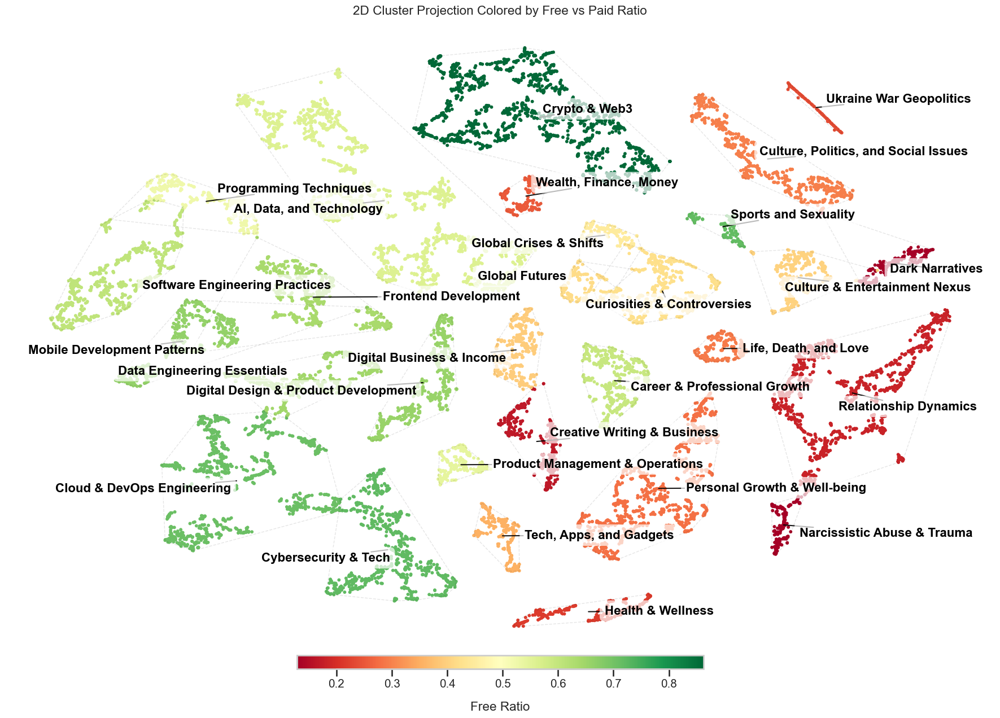

In [62]:
df_nn = df.loc[non_noise_mask].copy()

sns.set_style("whitegrid")
sns.set_context("talk", font_scale=0.9)

fig, ax = plt.subplots(figsize=(18, 12))

# continuous colormap for free/paid ratio
scatter = ax.scatter(
    df_nn["umap_2d_x"],
    df_nn["umap_2d_y"],
    c=colors_ratio,
    cmap="RdYlGn",
    s=18,
    alpha=1,
    linewidths=0,
    zorder=1,
)

# Prepare a distinct color per cluster for centroid markers (labels will be uniform color)
unique_clusters_2d = sorted(df_nn["cluster"].unique())

# Add dotted line convex hulls around each cluster
for cl in unique_clusters_2d:
    pts = df_nn.loc[df_nn["cluster"] == cl, ["umap_2d_x", "umap_2d_y"]].values
    if len(pts) >= 3:  # Need at least 3 points for a convex hull
        hull = ConvexHull(pts)
        hull_points = pts[hull.vertices]
        # Close the hull by appending the first point
        hull_points = np.append(hull_points, [hull_points[0]], axis=0)
        ax.plot(
            hull_points[:, 0],
            hull_points[:, 1],
            "k--",
            linewidth=1,
            alpha=0.1,
            zorder=2,
        )
palette = sns.color_palette("tab10", n_colors=max(10, len(unique_clusters_2d)))
cluster_color_map = {
    cl: palette[i % len(palette)] for i, cl in enumerate(unique_clusters_2d)
}

# uniform label appearance
label_text_color = "black"
label_bbox = dict(
    boxstyle="round,pad=0.4", facecolor="white", alpha=0.7, edgecolor="none"
)

# Collect texts for adjustment
texts = []

# Annotate cluster centroids showing only the topic (no cluster id or ratio), same color, no border
for cl in unique_clusters_2d:
    pts = df_nn.loc[df_nn["cluster"] == cl, ["umap_2d_x", "umap_2d_y"]].values
    if pts.shape[0] == 0:
        continue
    cx, cy = pts.mean(axis=0)

    # pick the most common topic string for this cluster if available
    topic = ""
    try:
        topic = str(df_nn.loc[df_nn["cluster"] == cl, "topic"].mode().iloc[0])
    except Exception:
        topic = ""

    label_text = topic if topic else ""

    # text label showing only topic, uniform color, no border
    if label_text:
        texts.append(
            ax.text(
                cx,
                cy,
                label_text,
                ha="center",
                va="center",
                fontsize=16,
                weight="semibold",
                color=label_text_color,
                zorder=4,
                bbox=label_bbox,
            )
        )

# Adjust text positions to avoid overlaps
adjust_text(texts, ax=ax, arrowprops=dict(arrowstyle="-", color="black", alpha=0.9))

ax.set_title("2D Cluster Projection Colored by Free vs Paid Ratio")

cbar_ax = fig.add_axes([0.3, 0.00, 0.4, 0.02])  # Centered, 50% width, smaller height
cbar = plt.colorbar(scatter, cax=cbar_ax, orientation="horizontal")
cbar.set_label("Free Ratio", rotation=0, labelpad=15)
ax.grid(False)
sns.despine(trim=True)
ax.spines["bottom"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.set_xticks([])
ax.set_yticks([])
plt.tight_layout()

plt.savefig("2D_Cluster_Free_Paid_Ratio.png", dpi=300, bbox_inches="tight")
plt.show()

### Statistics and Export

In [66]:
# Calculate overall proportion of free articles
overall_p = df["is_free"].mean()

# Collect results into a list of dictionaries
results = []
for cl in sorted(df["cluster"].unique()):
    if cl == -1:
        continue  # Skip noise cluster
    cluster_data = df[df["cluster"] == cl]
    is_free_vals = cluster_data["is_free"].astype(int).values
    cluster_size = len(is_free_vals)
    if len(is_free_vals) < 2:
        results.append({
            "Cluster": cl,
            "Topic": topic_dict.get(f"Cluster {cl}", f"Cluster {cl}"),
            "Size": cluster_size,
            "Mean Free": None,
            "Variance": None,
            "T-Statistic": None,
            "P-Value": None,
            "Significance": "Insufficient data"
        })
        continue
    t_stat, p_val = ttest_1samp(is_free_vals, overall_p)
    significance = "Significant" if p_val < 0.05 else "Not significant"
    mean_free = is_free_vals.mean()
    variance = np.var(is_free_vals)
    results.append({
        "Cluster": cl,
        "Topic": topic_dict.get(f"Cluster {cl}", f"Cluster {cl}"),
        "Size": cluster_size,
        "Mean Free": mean_free,
        "Variance": variance,
        "T-Statistic": t_stat,
        "P-Value": round(p_val, 5),
        "Significance": significance
    })

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# sort by mean
results_df = results_df.sort_values(by="Mean Free", ascending=False).reset_index(drop=True)

# Display the DataFrame
results_df


,Cluster,Topic,Size,Mean Free,Variance,T-Statistic,P-Value,Significance
0,5,Crypto & Web3,1489,0.862324,0.118722,40.563318,0.00000,Significant
1,2,Cybersecurity & Tech,765,0.721569,0.200907,13.663345,0.00000,Significant
2,7,Sports and Sexuality,155,0.716129,0.203288,5.948635,0.00000,Significant
3,1,Cloud & DevOps Engineering,1004,0.709163,0.206251,14.586072,0.00000,Significant
4,24,Mobile Development Patterns,477,0.662474,0.223602,7.496330,0.00000,Significant
5,4,Digital Design & Product Development,528,0.657197,0.225289,7.602902,0.00000,Significant
6,16,Data Engineering Essentials,489,0.646217,0.228621,6.755373,0.00000,Significant
7,11,Frontend Development,564,0.636525,0.231361,6.734739,0.00000,Significant
8,3,Software Engineering Practices,694,0.606628,0.238630,5.746137,0.00000,Significant
9,10,Career & Professional Growth,457,0.592998,0.241351,4.042316,0.00006,Significant


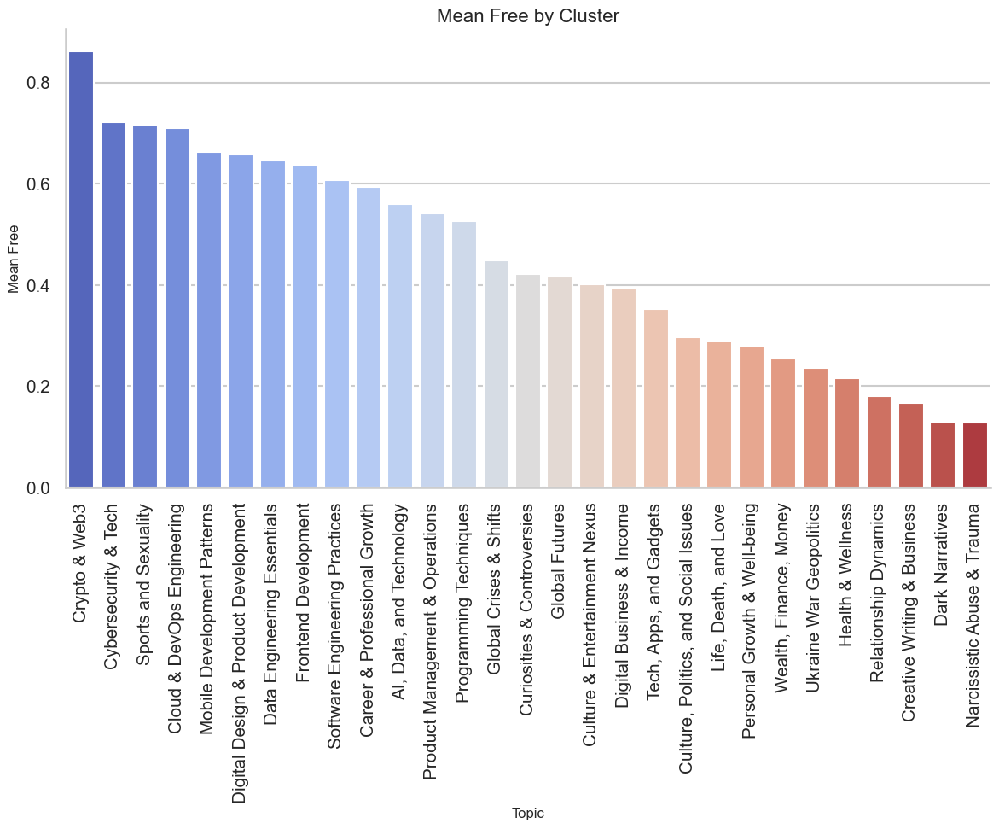

In [64]:
# Plot Mean Free for each cluster
plt.figure(figsize=(12, 10))
sns.barplot(
    x="Topic",
    y="Mean Free",
    data=results_df,
    palette="coolwarm",
    order=results_df.sort_values("Mean Free", ascending=False)["Topic"],
)

plt.title("Mean Free by Cluster", fontsize=16)
plt.xlabel("Topic", fontsize=12)
plt.ylabel("Mean Free", fontsize=12)
plt.xticks(rotation=90)
sns.despine()
plt.tight_layout()
plt.show()